In [1]:
from __future__ import print_function

import sys
sys.path.append('../') 
# adding euterpe 

import os
import copy
import numpy as np
from itertools import izip

import librosa as rs
import librosa.feature as ft
import librosa.display as dp
import librosa.segment as sg

import pymongo
from pymongo import MongoClient

import matplotlib.pyplot as plt
import IPython.display as ipd
%matplotlib inline

from euterpe.utils import *
from euterpe.track import track

DB_PATH = '../data-raw/tracks/'
FILE_TYPE = 'mp3'

In [2]:
# directory infomation extraction
tracklist = np.array(gen_tracklist(DB_PATH))
trackdict = gen_trackdict(DB_PATH) # can change field
# TODO: append default offset and duration before saving in db

In [3]:
sample = copy.deepcopy(trackdict[0])
sample.update({
    'offset' : 0.0,
    'duration' : None
}); sample

{'album': 'Frank',
 'artist': 'Amy Winehouse',
 'duration': None,
 'name': 'What Is It About Men',
 'offset': 0.0}

In [4]:
t1 = track(**sample)
t1.basic_info() # RuntimeError test

RuntimeError: Some attrs are missing.

In [5]:
t1.load(DB_PATH, FILE_TYPE)
t1.basic_info()

Attr assigned: _sr
Attr assigned: _y
Attr assigned: _duration
Artist: Amy Winehouse, Album: Frank, Track Name: What Is It About Men,Offset: 0.0,Duration: 209.63


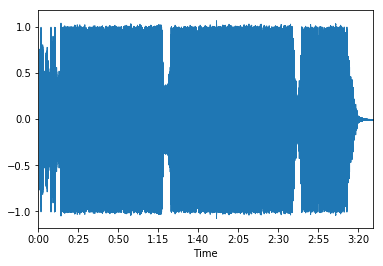

In [6]:
plt.plot()
dp.waveplot(t1._y, t1._sr)

In [7]:
ipd.Audio(t1._y, rate = t1._sr)
# https://musicinformationretrieval.com